## LL3 (abs logFC based) 25D3

In [1]:
library (tidyverse)
library (openxlsx)
library (magrittr)  
library (ggrepel)
library (reshape2)
library (readr)
library (ggpubr)
library (drc)
library (broom)
library (modelr)
library (purrr)

── Attaching packages ────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   2.1.1     ✔ forcats 0.5.1

── Conflicts ───────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘magrittr’


The following object is masked from ‘package:purrr’:

    set_names


The following object is masked from ‘package:tidyr’:

    extract



Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select



'drc' has been loaded.


Please cite R and 'drc' if used for a publication,

for references type 'citation()' and 'citation('drc')'.



Attaching package: ‘drc’


The following objects

In [2]:
fig <- function(width, heigth){
options(repr.plot.width = width, repr.plot.height = heigth) }

In [3]:
long = read.table("./data/f_CA2021_inlog_FC15_FC2_evidence-threshold_final.tsv", sep = '\t', row.names =1, header = T)

In [4]:
d = long %>%
filter (., ref_206  == "yes")
dim (d)

[1] 206 150

In [5]:
str(d, list.len=ncol(d))

'data.frame':	206 obs. of  150 variables:
 $ EtOH_x_04h_R1          : num  3.863 11.708 0.169 3.332 5.89 ...
 $ EtOH_x_04h_R2          : num  3.447 11.653 0.189 3.894 5.829 ...
 $ EtOH_x_04h_R3          : num  3.794 11.724 -0.191 3.652 5.732 ...
 $ EtOH_x_08h_R1          : num  5.17 11.82 1.74 3.02 5.5 ...
 $ EtOH_x_08h_R2          : num  5.32 11.81 2.3 2.92 5.33 ...
 $ EtOH_x_08h_R3          : num  5.72 11.78 1.96 2.84 4.83 ...
 $ EtOH_x_24h_R1          : num  6.77 12.9 2.26 4.96 5.56 ...
 $ EtOH_x_24h_R2          : num  6.61 12.62 3.04 4.42 5.26 ...
 $ EtOH_x_24h_R3          : num  7.19 12.47 2.74 4.6 4.38 ...
 $ V125D3_0.1nM_24h_R1    : num  6.29 12.37 2.72 4.58 4.8 ...
 $ V125D3_0.1nM_24h_R2    : num  6.57 12.11 3.02 4.38 4.53 ...
 $ V125D3_0.1nM_24h_R3    : num  6.48 12.31 3.2 4.38 4.59 ...
 $ V125D3_10nM_04h_R1     : num  3.166 11.387 0.208 3.374 5.127 ...
 $ V125D3_10nM_04h_R2     : num  3.255 11.405 0.879 3.691 5.543 ...
 $ V125D3_10nM_04h_R3     : num  3.387 11.52 -0.191 3.326

## average FC per time point

In [6]:
d1 = d %>%
dplyr::select (., matches ("logFC_V125D3"))

d2 = d %>%
dplyr::select (., matches ("logFC_V25D2"))

d3 = d %>%
dplyr::select (., matches ("logFC_V25D3"))

In [7]:
str (d1)
str (d2)
str (d3)

'data.frame':	206 obs. of  5 variables:
 $ logFC_V125D3_1nM_24h  : num  -0.477 -0.838 2.001 -0.888 -2.43 ...
 $ logFC_V125D3_10nM_04h : num  -0.491 -0.257 0.959 -0.198 -0.416 ...
 $ logFC_V125D3_10nM_08h : num  -0.944 -0.475 0.781 -1.463 -1.186 ...
 $ logFC_V125D3_10nM_24h : num  -1.43 -1.31 1.84 -2.26 -2.44 ...
 $ logFC_V125D3_0.1nM_24h: num  -0.439 -0.409 0.354 -0.249 -0.518 ...
'data.frame':	206 obs. of  7 variables:
 $ logFC_V25D2_1000nM_04h: num  -0.627 -0.311 2.343 -0.49 -0.288 ...
 $ logFC_V25D2_1000nM_08h: num  -1.662 -0.307 0.237 -0.601 -0.929 ...
 $ logFC_V25D2_1000nM_24h: num  -1.83 -1.54 1.79 -2.61 -2.99 ...
 $ logFC_V25D2_100nM_24h : num  -0.218 -0.182 0.879 -0.248 -0.165 ...
 $ logFC_V25D2_250nM_24h : num  -0.147 -0.506 0.971 -0.745 -0.947 ...
 $ logFC_V25D2_500nM_24h : num  -1.42 -1.35 2.21 -1.96 -2.65 ...
 $ logFC_V25D2_750nM_24h : num  -1.32 -1.46 2.11 -2.5 -2.5 ...
'data.frame':	206 obs. of  7 variables:
 $ logFC_V25D3_1000nM_04h: num  -0.671 -0.311 2.458 -0.507 -0.41

In [8]:
d$abs_logFC_V125D3_0.1nM_24h = abs (d$logFC_V125D3_0.1nM_24h)
d$abs_logFC_V125D3_1nM_24h = abs (d$logFC_V125D3_1nM_24h)
d$abs_logFC_V125D3_10nM_24h = abs (d$logFC_V125D3_10nM_24h)

d$abs_logFC_V25D3_100nM_24h = abs(d$logFC_V25D3_100nM_24h)
d$abs_logFC_V25D3_250nM_24h = abs(d$logFC_V25D3_250nM_24h)
d$abs_logFC_V25D3_500nM_24h = abs(d$logFC_V25D3_500nM_24h)
d$abs_logFC_V25D3_750nM_24h = abs(d$logFC_V25D3_750nM_24h)
d$abs_logFC_V25D3_1000nM_24h = abs(d$logFC_V25D3_1000nM_24h)

d$abs_logFC_V25D2_100nM_24h = abs(d$logFC_V25D2_100nM_24h)
d$abs_logFC_V25D2_250nM_24h = abs(d$logFC_V25D2_250nM_24h)
d$abs_logFC_V25D2_500nM_24h = abs(d$logFC_V25D2_500nM_24h)
d$abs_logFC_V25D2_750nM_24h = abs(d$logFC_V25D2_750nM_24h)
d$abs_logFC_V25D2_1000nM_24h = abs(d$logFC_V25D2_1000nM_24h)

MEAN

In [9]:
davg = d %>%
dplyr::select (., abs_logFC_V25D3_100nM_24h:abs_logFC_V25D3_1000nM_24h)

In [10]:
davg = davg %>% 
  mutate (abs_logFC_V25D3_0_24h = rep(0,nrow(.)))

In [11]:
head (davg)

,abs_logFC_V25D3_100nM_24h,abs_logFC_V25D3_250nM_24h,abs_logFC_V25D3_500nM_24h,abs_logFC_V25D3_750nM_24h,abs_logFC_V25D3_1000nM_24h,abs_logFC_V25D3_0_24h
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,0.4560737628,0.3646486,1.339799,1.544729,1.547650,0
ACTB,0.1396877914,0.1657075,1.290586,1.361878,1.467328,0
ACVRL1,0.3551800103,0.8042271,2.102989,2.247590,2.333229,0
ADAMTSL4,0.0009974205,0.2840163,1.736644,2.498829,2.122494,0
ADGRE1,0.0008389146,0.6319969,2.451953,2.473238,2.863103,0
ADGRE3,0.9945369972,0.1492797,3.600812,2.380731,2.284476,0


In [12]:
dt = davg

In [13]:
newfishes = rownames (dt)
head(newfishes)

[1] "ABCC3"    "ACTB"     "ACVRL1"   "ADAMTSL4" "ADGRE1"   "ADGRE3"

In [14]:
df2_Ind = as.vector (colnames (dt))

df_y = colsplit(df2_Ind, "_", c("placeholder","placeholder2","treatment", "concentration", "time"))
df_y = as.data.frame(unclass(df_y))
df_y$sample <- df2_Ind

df_y = df_y %>%
  mutate(., conc = concentration)

df_y$conc <- gsub("nM","",as.character(df_y$conc))
df_y$conc = as.numeric (df_y$conc)

df_y

placeholder,placeholder2,treatment,concentration,time,sample,conc
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
abs,logFC,V25D3,100nM,24h,abs_logFC_V25D3_100nM_24h,100
abs,logFC,V25D3,250nM,24h,abs_logFC_V25D3_250nM_24h,250
abs,logFC,V25D3,500nM,24h,abs_logFC_V25D3_500nM_24h,500
abs,logFC,V25D3,750nM,24h,abs_logFC_V25D3_750nM_24h,750
abs,logFC,V25D3,1000nM,24h,abs_logFC_V25D3_1000nM_24h,1000
abs,logFC,V25D3,0,24h,abs_logFC_V25D3_0_24h,0


In [15]:
small_pwt_T = as.data.frame (t(dt))
small_pwt_T

small_pwt_T = small_pwt_T %>%
  rownames_to_column ("sample")

mrg = merge(x=small_pwt_T,y=df_y,by.x="sample", all.x =T)
(head)

head(mrg)

,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,AQP9,⋯,TMEM176A,TMEM176B,TNFRSF21,TNFRSF4,TREM1,TRIM36,TRPM2,TXLNB,VSIG4,ZBTB46
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
abs_logFC_V25D3_100nM_24h,0.4560738,0.1396878,0.3551800,0.0009974205,0.0008389146,0.9945370,0.6706574,0.1681644,0.5683924,0.5276207,⋯,0.0334841,0.03881188,0.8730185,0.5722296,1.134698,0.3373138,0.1818257,0.2359117,0.7837885,0.07833899
abs_logFC_V25D3_250nM_24h,0.3646486,0.1657075,0.8042271,0.2840162971,0.6319968970,0.1492797,1.2589922,0.4856918,0.6746098,0.8724092,⋯,0.2574778,0.22728758,1.3098793,1.0153921,1.695390,0.5338953,0.2127181,0.3915551,0.4970683,0.60621941
abs_logFC_V25D3_500nM_24h,1.3397987,1.2905857,2.1029892,1.7366435339,2.4519525136,3.6008117,2.4355711,1.9695699,1.5134255,1.8782672,⋯,3.2849022,2.78087187,2.6195552,2.0003847,2.870493,3.0375181,2.6750563,3.4532803,1.8350509,3.93981460
abs_logFC_V25D3_750nM_24h,1.5447289,1.3618778,2.2475903,2.4988291892,2.4732376340,2.3807307,2.7365797,1.7902516,1.7897893,2.0941884,⋯,3.5453332,3.16966653,2.9368435,2.0839196,2.979120,3.3267811,3.2430768,4.0379983,2.3116471,3.22182206
abs_logFC_V25D3_1000nM_24h,1.5476503,1.4673278,2.3332293,2.1224943730,2.8631027635,2.2844761,2.2197876,2.5485440,1.7719692,2.4023386,⋯,3.5132855,3.07246169,3.0265973,2.3591414,3.245692,3.1624638,3.3132770,3.7546478,2.2523619,3.75197328
abs_logFC_V25D3_0_24h,0.0000000,0.0000000,0.0000000,0.0000000000,0.0000000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.0000000,0.00000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.00000000


function (x, ...) 
UseMethod("head")
<bytecode: 0x5572593df420>
<environment: namespace:utils>

,sample,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,⋯,TRPM2,TXLNB,VSIG4,ZBTB46,placeholder,placeholder2,treatment,concentration,time,conc
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,abs_logFC_V25D3_0_24h,0.0000000,0.0000000,0.0000000,0.0000000000,0.0000000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.0000000,0.0000000,0.0000000,0.00000000,abs,logFC,V25D3,0,24h,0
2,abs_logFC_V25D3_1000nM_24h,1.5476503,1.4673278,2.3332293,2.1224943730,2.8631027635,2.2844761,2.2197876,2.5485440,1.7719692,⋯,3.3132770,3.7546478,2.2523619,3.75197328,abs,logFC,V25D3,1000nM,24h,1000
3,abs_logFC_V25D3_100nM_24h,0.4560738,0.1396878,0.3551800,0.0009974205,0.0008389146,0.9945370,0.6706574,0.1681644,0.5683924,⋯,0.1818257,0.2359117,0.7837885,0.07833899,abs,logFC,V25D3,100nM,24h,100
4,abs_logFC_V25D3_250nM_24h,0.3646486,0.1657075,0.8042271,0.2840162971,0.6319968970,0.1492797,1.2589922,0.4856918,0.6746098,⋯,0.2127181,0.3915551,0.4970683,0.60621941,abs,logFC,V25D3,250nM,24h,250
5,abs_logFC_V25D3_500nM_24h,1.3397987,1.2905857,2.1029892,1.7366435339,2.4519525136,3.6008117,2.4355711,1.9695699,1.5134255,⋯,2.6750563,3.4532803,1.8350509,3.93981460,abs,logFC,V25D3,500nM,24h,500
6,abs_logFC_V25D3_750nM_24h,1.5447289,1.3618778,2.2475903,2.4988291892,2.4732376340,2.3807307,2.7365797,1.7902516,1.7897893,⋯,3.2430768,4.0379983,2.3116471,3.22182206,abs,logFC,V25D3,750nM,24h,750


In [16]:
# create a vector with letters in the desired order
roworder <- c("abs_logFC_V25D3_0_24h", "abs_logFC_V25D3_100nM_24h", "abs_logFC_V25D3_250nM_24h", "abs_logFC_V25D3_500nM_24h", "abs_logFC_V25D3_750nM_24h",  "abs_logFC_V25D3_1000nM_24h")

mrg = mrg %>%
  slice(match(roworder, sample))

In [17]:
head (mrg)

,sample,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,⋯,TRPM2,TXLNB,VSIG4,ZBTB46,placeholder,placeholder2,treatment,concentration,time,conc
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,abs_logFC_V25D3_0_24h,0.0000000,0.0000000,0.0000000,0.0000000000,0.0000000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.0000000,0.0000000,0.0000000,0.00000000,abs,logFC,V25D3,0,24h,0
2,abs_logFC_V25D3_100nM_24h,0.4560738,0.1396878,0.3551800,0.0009974205,0.0008389146,0.9945370,0.6706574,0.1681644,0.5683924,⋯,0.1818257,0.2359117,0.7837885,0.07833899,abs,logFC,V25D3,100nM,24h,100
3,abs_logFC_V25D3_250nM_24h,0.3646486,0.1657075,0.8042271,0.2840162971,0.6319968970,0.1492797,1.2589922,0.4856918,0.6746098,⋯,0.2127181,0.3915551,0.4970683,0.60621941,abs,logFC,V25D3,250nM,24h,250
4,abs_logFC_V25D3_500nM_24h,1.3397987,1.2905857,2.1029892,1.7366435339,2.4519525136,3.6008117,2.4355711,1.9695699,1.5134255,⋯,2.6750563,3.4532803,1.8350509,3.93981460,abs,logFC,V25D3,500nM,24h,500
5,abs_logFC_V25D3_750nM_24h,1.5447289,1.3618778,2.2475903,2.4988291892,2.4732376340,2.3807307,2.7365797,1.7902516,1.7897893,⋯,3.2430768,4.0379983,2.3116471,3.22182206,abs,logFC,V25D3,750nM,24h,750
6,abs_logFC_V25D3_1000nM_24h,1.5476503,1.4673278,2.3332293,2.1224943730,2.8631027635,2.2844761,2.2197876,2.5485440,1.7719692,⋯,3.3132770,3.7546478,2.2523619,3.75197328,abs,logFC,V25D3,1000nM,24h,1000


In [18]:
mrg2 = mrg %>% 
  pivot_longer(all_of(newfishes)) %>%  #eighthours
  arrange (name)

mrg2$name <- as.factor(mrg2$name)
head (mrg2)

mrg2 = mrg2 %>%
  dplyr::group_by(name) 
head (mrg2)

sample,placeholder,placeholder2,treatment,concentration,time,conc,name,value
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>
abs_logFC_V25D3_0_24h,abs,logFC,V25D3,0,24h,0,ABCC3,0.0000000
abs_logFC_V25D3_100nM_24h,abs,logFC,V25D3,100nM,24h,100,ABCC3,0.4560738
abs_logFC_V25D3_250nM_24h,abs,logFC,V25D3,250nM,24h,250,ABCC3,0.3646486
abs_logFC_V25D3_500nM_24h,abs,logFC,V25D3,500nM,24h,500,ABCC3,1.3397987
abs_logFC_V25D3_750nM_24h,abs,logFC,V25D3,750nM,24h,750,ABCC3,1.5447289
abs_logFC_V25D3_1000nM_24h,abs,logFC,V25D3,1000nM,24h,1000,ABCC3,1.5476503


sample,placeholder,placeholder2,treatment,concentration,time,conc,name,value
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>
abs_logFC_V25D3_0_24h,abs,logFC,V25D3,0,24h,0,ABCC3,0.0000000
abs_logFC_V25D3_100nM_24h,abs,logFC,V25D3,100nM,24h,100,ABCC3,0.4560738
abs_logFC_V25D3_250nM_24h,abs,logFC,V25D3,250nM,24h,250,ABCC3,0.3646486
abs_logFC_V25D3_500nM_24h,abs,logFC,V25D3,500nM,24h,500,ABCC3,1.3397987
abs_logFC_V25D3_750nM_24h,abs,logFC,V25D3,750nM,24h,750,ABCC3,1.5447289
abs_logFC_V25D3_1000nM_24h,abs,logFC,V25D3,1000nM,24h,1000,ABCC3,1.5476503


In [19]:
save(mrg2,
     file = "data/mrg2table_abs25D3.RData")

In [20]:
load(file = "data/mrg2table_abs25D3.RData")

In [21]:
mrg3= mrg2 %>%
dplyr::select (., c("conc", "name", "value")) 

head(mrg3)

conc,name,value
<dbl>,<fct>,<dbl>
0,ABCC3,0.0000000
100,ABCC3,0.4560738
250,ABCC3,0.3646486
500,ABCC3,1.3397987
750,ABCC3,1.5447289
1000,ABCC3,1.5476503


ec_50:(Intercept) 
         321.9004

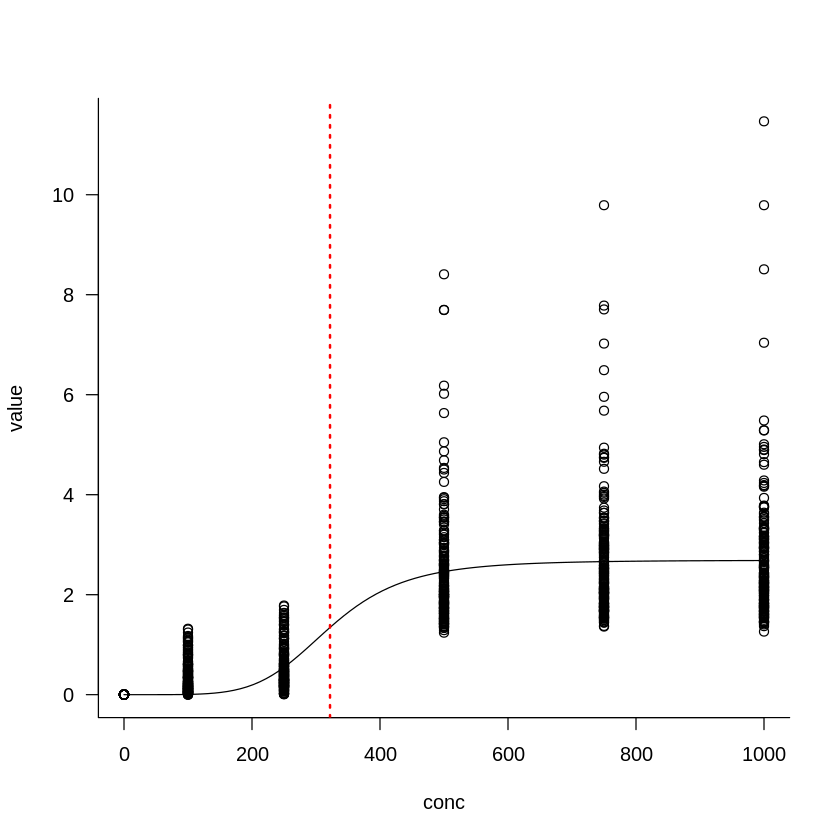

In [22]:
hydroxytestLL.3 <- drm(value ~ conc,
                 #  curveid = name, 
                   data = mrg2,

  fct = LL.3(
 #     fixed=c(NA, max(mrg2$value), NA), #max(mrg2$value)
      names = c('hill', 'max_value', 'ec_50')))
#))

ec50 <- hydroxytestLL.3$coefficients['ec_50:(Intercept)']
ec50

plot(hydroxytestLL.3, bty="l", type = "all", broken=TRUE, log = "")#log = ""
abline(v = ec50, col="red", lwd=2, lty=3)
#abline(h = 0.5, col="red", lwd=2, lty=3)

In [23]:
summary (hydroxytestLL.3)


Model fitted: Log-logistic (ED50 as parameter) with lower limit at 0 (3 parms)

Parameter estimates:

                        Estimate Std. Error t-value   p-value    
hill:(Intercept)       -5.394918   0.609755 -8.8477 < 2.2e-16 ***
max_value:(Intercept)   2.689336   0.050406 53.3534 < 2.2e-16 ***
ec_50:(Intercept)     321.900399  10.401874 30.9464 < 2.2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error:

 0.8829503 (1233 degrees of freedom)

In [24]:
round (321.900399)
round (10.401874)

[1] 322

[1] 10

In [25]:
mrg4= mrg3 %>%
#dplyr::select (., c("conc", "name", "value")) %>% 
summarise(real_maxval = max(value))

In [26]:
d = mrg3  %>% 
nest(-name)

head(d)

Warning message:
“All elements of `...` must be named.
Did you want `data = c(conc, value)`?”


name,data
<fct>,<list>
ABCC3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.4560738, 0.3646486, 1.3397987, 1.5447289, 1.5476503"
ACTB,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1396878, 0.1657075, 1.2905857, 1.3618778, 1.4673278"
ACVRL1,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.3551800, 0.8042271, 2.1029892, 2.2475903, 2.3332293"
ADAMTSL4,"0.000000e+00, 1.000000e+02, 2.500000e+02, 5.000000e+02, 7.500000e+02, 1.000000e+03, 0.000000e+00, 9.974205e-04, 2.840163e-01, 1.736644e+00, 2.498829e+00, 2.122494e+00"
ADGRE1,"0.000000e+00, 1.000000e+02, 2.500000e+02, 5.000000e+02, 7.500000e+02, 1.000000e+03, 0.000000e+00, 8.389146e-04, 6.319969e-01, 2.451953e+00, 2.473238e+00, 2.863103e+00"
ADGRE3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.9945370, 0.1492797, 3.6008117, 2.3807307, 2.2844761"


In [27]:
d = d %>%
mutate (real_maxval = map_dbl(data, ~{max(.x$value)}))
#tidy

head (d)

name,data,real_maxval
<fct>,<list>,<dbl>
ABCC3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.4560738, 0.3646486, 1.3397987, 1.5447289, 1.5476503",1.547650
ACTB,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1396878, 0.1657075, 1.2905857, 1.3618778, 1.4673278",1.467328
ACVRL1,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.3551800, 0.8042271, 2.1029892, 2.2475903, 2.3332293",2.333229
ADAMTSL4,"0.000000e+00, 1.000000e+02, 2.500000e+02, 5.000000e+02, 7.500000e+02, 1.000000e+03, 0.000000e+00, 9.974205e-04, 2.840163e-01, 1.736644e+00, 2.498829e+00, 2.122494e+00",2.498829
ADGRE1,"0.000000e+00, 1.000000e+02, 2.500000e+02, 5.000000e+02, 7.500000e+02, 1.000000e+03, 0.000000e+00, 8.389146e-04, 6.319969e-01, 2.451953e+00, 2.473238e+00, 2.863103e+00",2.863103
ADGRE3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.9945370, 0.1492797, 3.6008117, 2.3807307, 2.2844761",3.600812


In [28]:
gene_model_LL.3 <- function(df){
drm(value ~ conc, 
#    weights = Total, 
    data = df, 
#    type = "binomial", 
    fct= LL.3(names = c('hill', 'max_value', 'ec_50')))
}

In [29]:
#Fitting models to nested data

d = d %>%
mutate (fit = map(data, gene_model_LL.3)) #%>%
#tidy

head (d, n =2)

name 
1 ABCC3
2 ACTB 
  data                                                                                                                                         
1 0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.4560738, 0.3646486, 1.3397987, 1.5447289, 1.5476503
2 0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1396878, 0.1657075, 1.2905857, 1.3618778, 1.4673278
  real_maxval
1 1.547650   
2 1.467328   
  fit                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [30]:
d$fit[d$name == "ABCC3"]

[[1]]

A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -1.545                  2.077                419.321  



In [31]:
models <- map(split(mrg2,
                    mrg2$name),
                    gene_model_LL.3)

result <- map_df(models,
                 tidy,
                 .id = "name")

head (result)

name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,hill,(Intercept),-1.545216,1.57229108,-0.9827797,0.398184256
ABCC3,max_value,(Intercept),2.076643,1.30999608,1.5852287,0.211093044
ABCC3,ec_50,(Intercept),419.321380,397.83774323,1.0540010,0.369270248
ACTB,hill,(Intercept),-6.053770,1.60026471,-3.7829806,0.032377557
ACTB,max_value,(Intercept),1.426124,0.07096189,20.0970382,0.000269288
ACTB,ec_50,(Intercept),348.141986,31.00365617,11.2290623,0.001514181


In [32]:
res_ec50 = result %>%
filter (., term == "ec_50")

head (res_ec50)

res_pred_maxval = result %>%
filter (., term == "max_value")

head (res_pred_maxval)

name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559


name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,max_value,(Intercept),2.076643,1.30999608,1.585229,0.2110930439
ACTB,max_value,(Intercept),1.426124,0.07096189,20.097038,0.0002692880
ACVRL1,max_value,(Intercept),2.461140,0.27569876,8.926918,0.0029654236
ADAMTSL4,max_value,(Intercept),2.344029,0.16503210,14.203475,0.0007561201
ADGRE1,max_value,(Intercept),2.719239,0.13513864,20.121845,0.0002682992
ADGRE3,max_value,(Intercept),2.755346,0.47918137,5.750111,0.0104488141


In [33]:
res_model = full_join (res_ec50, res_pred_maxval, by = c("name" = "name"), suffix=c(".ec_50","pred_maxval")) 

head (res_model)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248,max_value,(Intercept),2.076643,1.30999608,1.585229,0.2110930439
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181,max_value,(Intercept),1.426124,0.07096189,20.097038,0.0002692880
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925,max_value,(Intercept),2.461140,0.27569876,8.926918,0.0029654236
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521,max_value,(Intercept),2.344029,0.16503210,14.203475,0.0007561201
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903,max_value,(Intercept),2.719239,0.13513864,20.121845,0.0002682992
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559,max_value,(Intercept),2.755346,0.47918137,5.750111,0.0104488141


In [34]:
head (d$fit, n=2)

[[1]]

A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -1.545                  2.077                419.321  


[[2]]

A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -6.054                  1.426                348.142  



In [35]:
d$fit[[1]]


A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -1.545                  2.077                419.321  


In [36]:
real_FC = as.vector (d$real_maxval)
#real_halfFC = as.vector (0.5*(d$real_maxval)) 

In [37]:
head (res_model)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248,max_value,(Intercept),2.076643,1.30999608,1.585229,0.2110930439
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181,max_value,(Intercept),1.426124,0.07096189,20.097038,0.0002692880
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925,max_value,(Intercept),2.461140,0.27569876,8.926918,0.0029654236
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521,max_value,(Intercept),2.344029,0.16503210,14.203475,0.0007561201
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903,max_value,(Intercept),2.719239,0.13513864,20.121845,0.0002682992
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559,max_value,(Intercept),2.755346,0.47918137,5.750111,0.0104488141


In [38]:
res_model2 = res_model %>%
add_column (real_FC) %>%
mutate (., pred_halfFC = 0.5*estimatepred_maxval) %>%
mutate (., real_halfFC = 0.5*real_FC) %>%
mutate (., ratio_predvsreal = (pred_halfFC/real_halfFC)) %>%
mutate (., perc_dev = abs(ratio_predvsreal-1)*100)

head (res_model2)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval,real_FC,pred_halfFC,real_halfFC,ratio_predvsreal,perc_dev
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248,max_value,(Intercept),2.076643,1.30999608,1.585229,0.2110930439,1.547650,1.0383217,0.7738252,1.3418040,34.180401
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181,max_value,(Intercept),1.426124,0.07096189,20.097038,0.0002692880,1.467328,0.7130619,0.7336639,0.9719191,2.808093
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925,max_value,(Intercept),2.461140,0.27569876,8.926918,0.0029654236,2.333229,1.2305701,1.1666147,1.0548214,5.482139
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521,max_value,(Intercept),2.344029,0.16503210,14.203475,0.0007561201,2.498829,1.1720147,1.2494146,0.9380511,6.194894
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903,max_value,(Intercept),2.719239,0.13513864,20.121845,0.0002682992,2.863103,1.3596193,1.4315514,0.9497524,5.024762
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559,max_value,(Intercept),2.755346,0.47918137,5.750111,0.0104488141,3.600812,1.3776731,1.8004058,0.7652014,23.479860


In [39]:
#write.xlsx (res_model2, "./ec50table_25D3_LL3.xlsx")

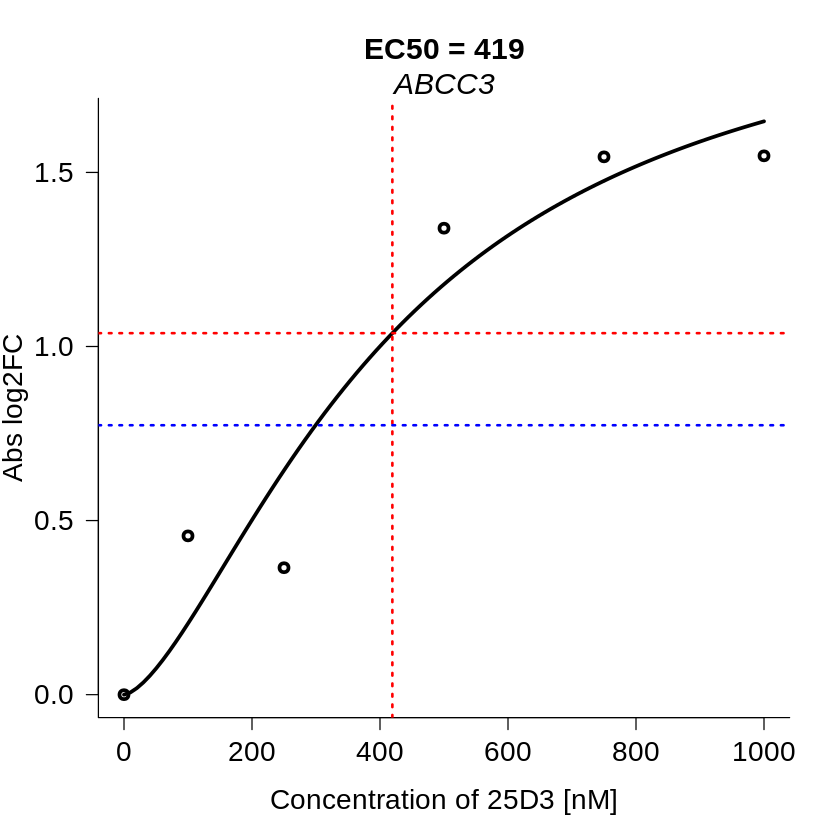

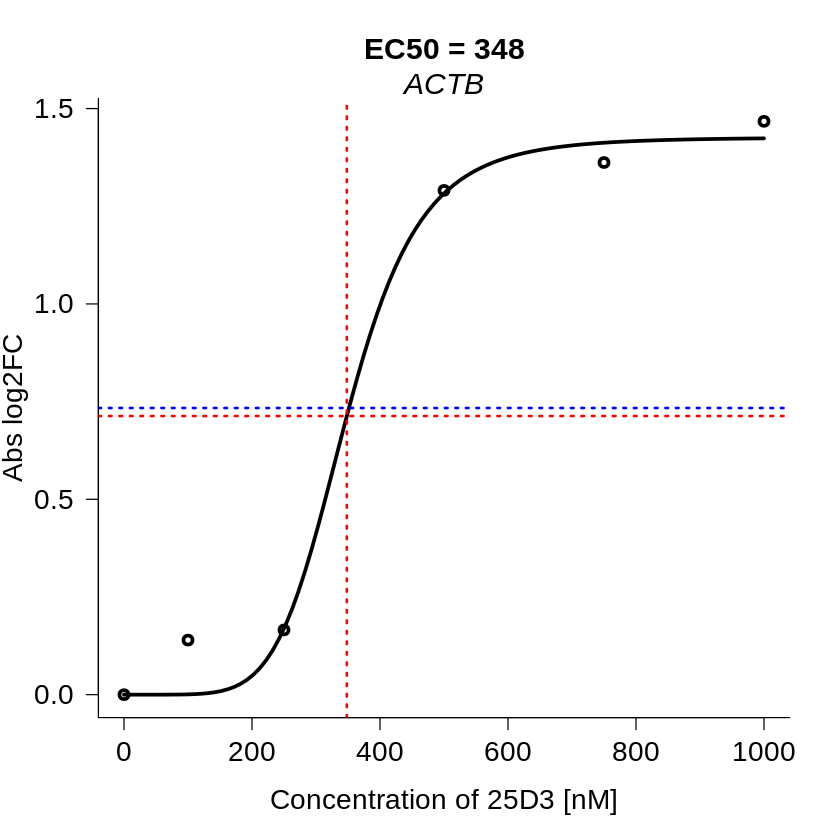

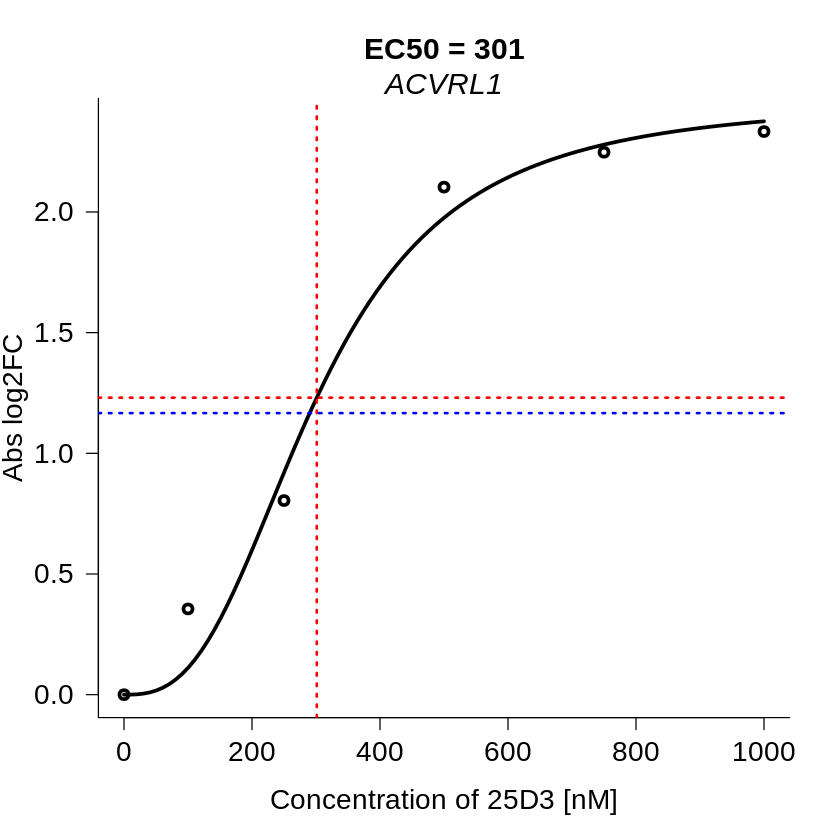

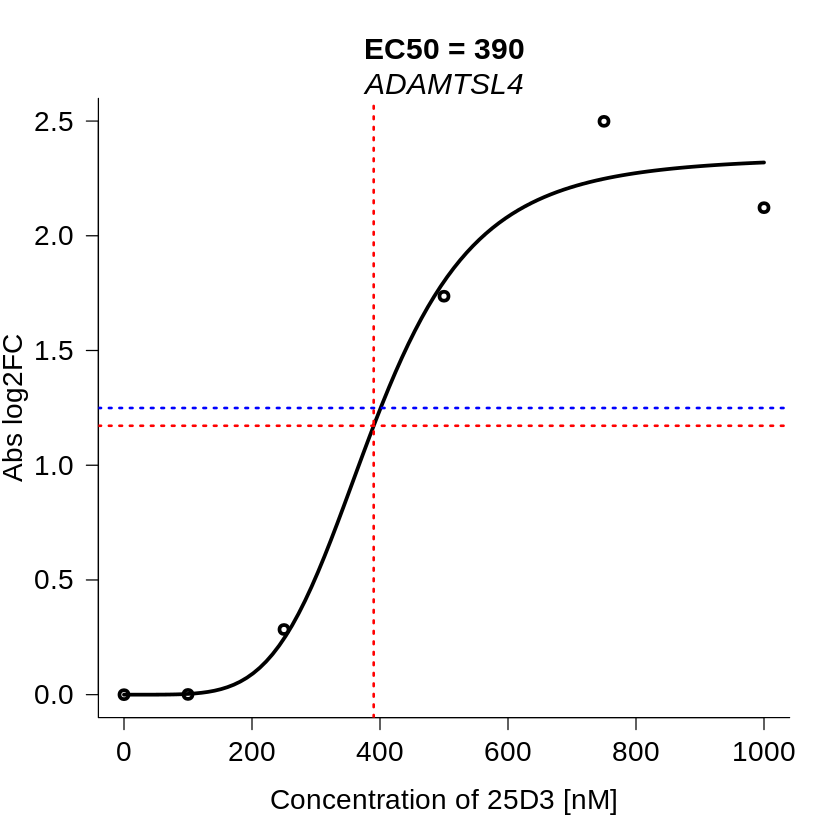

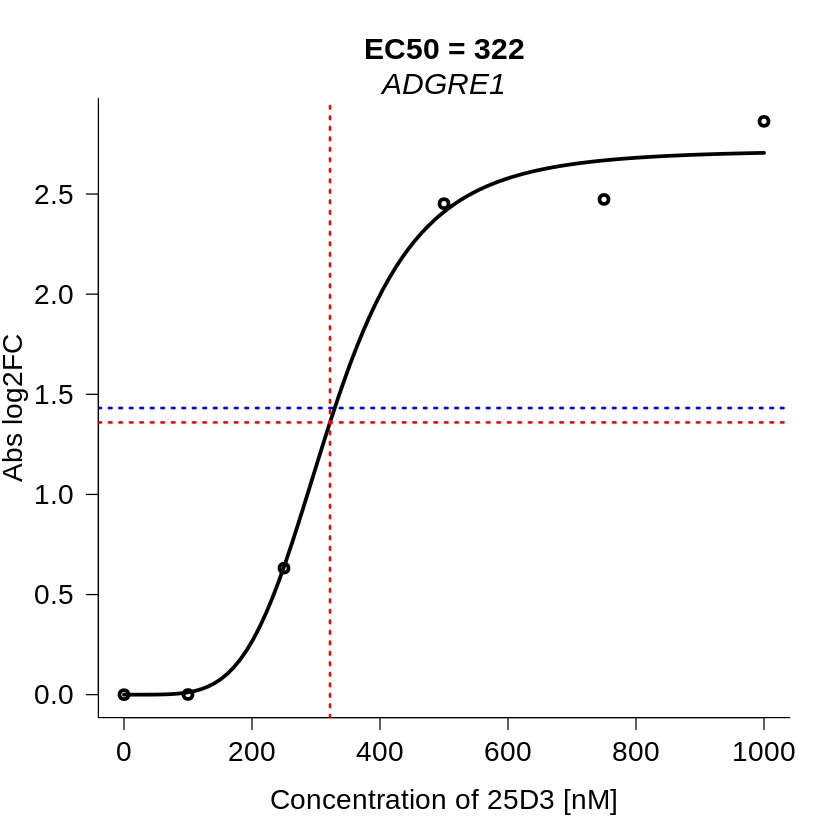

...

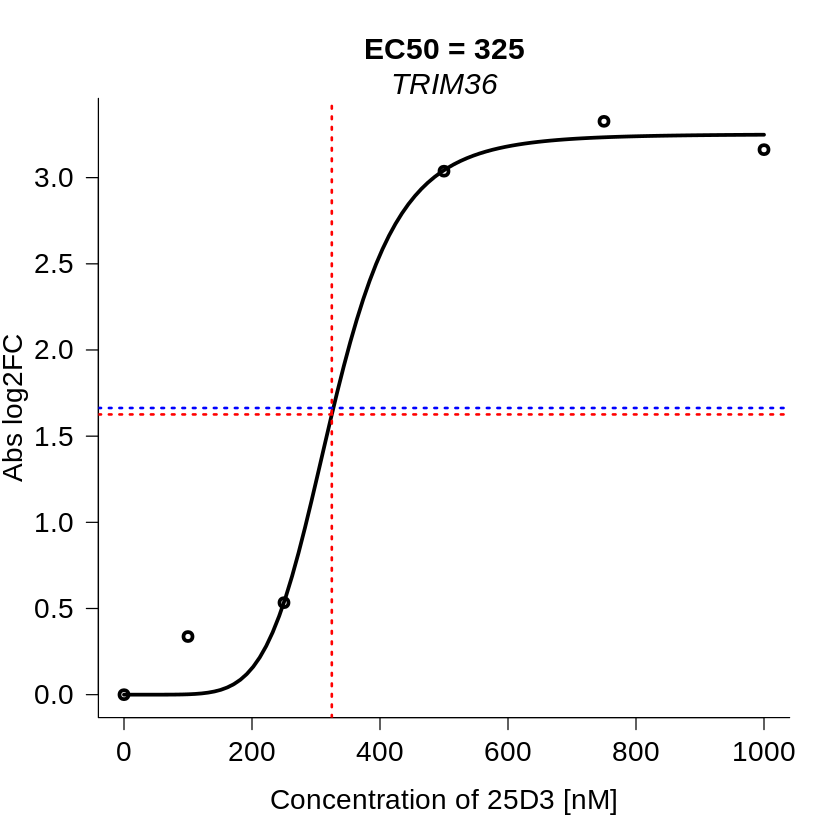

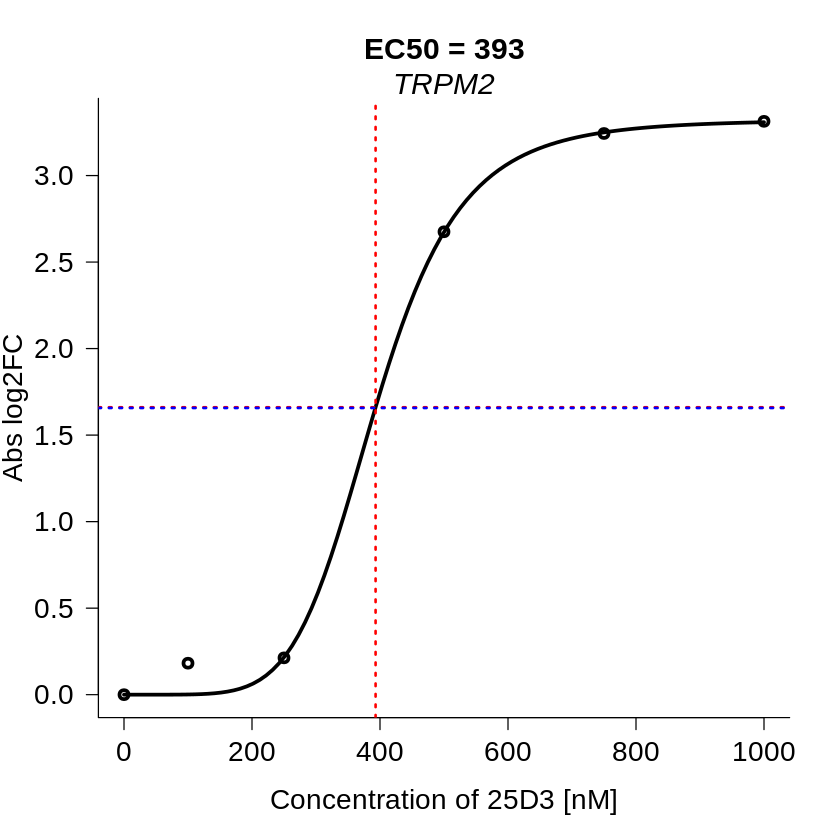

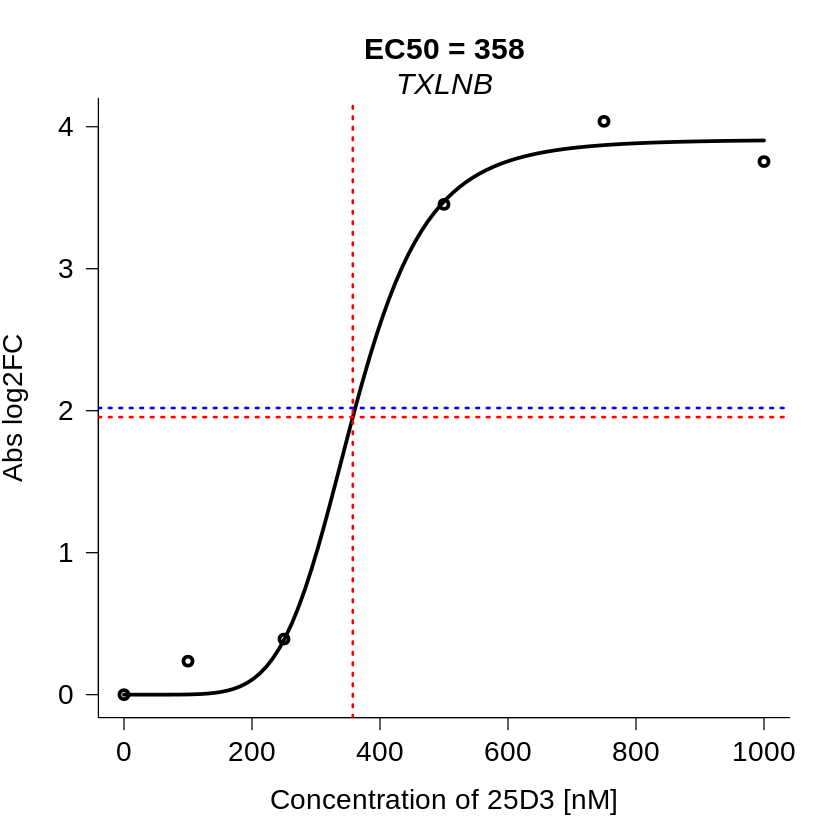

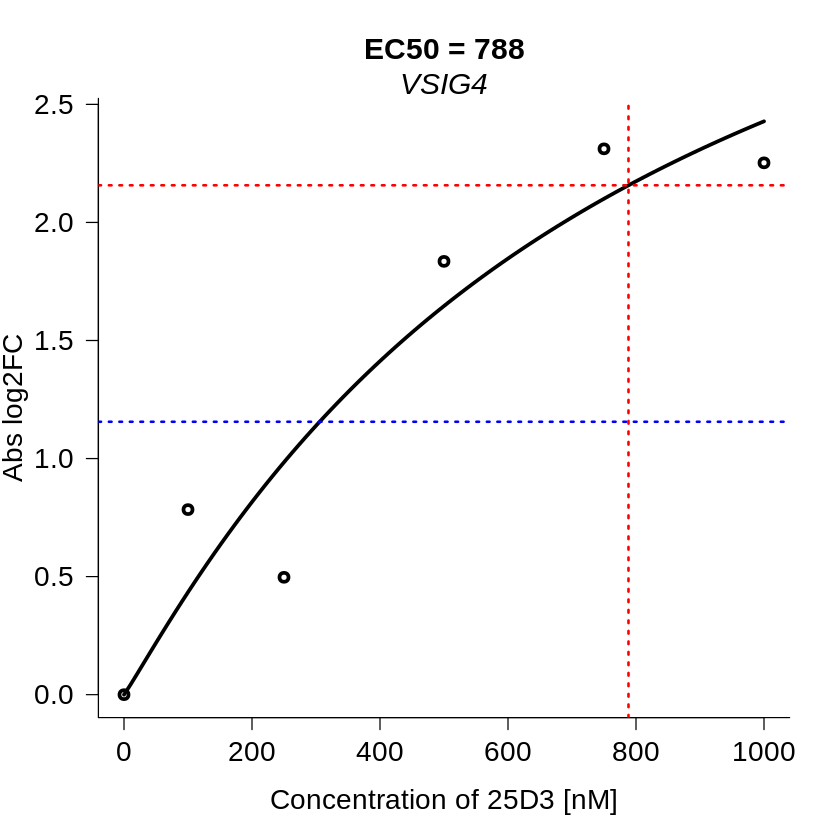

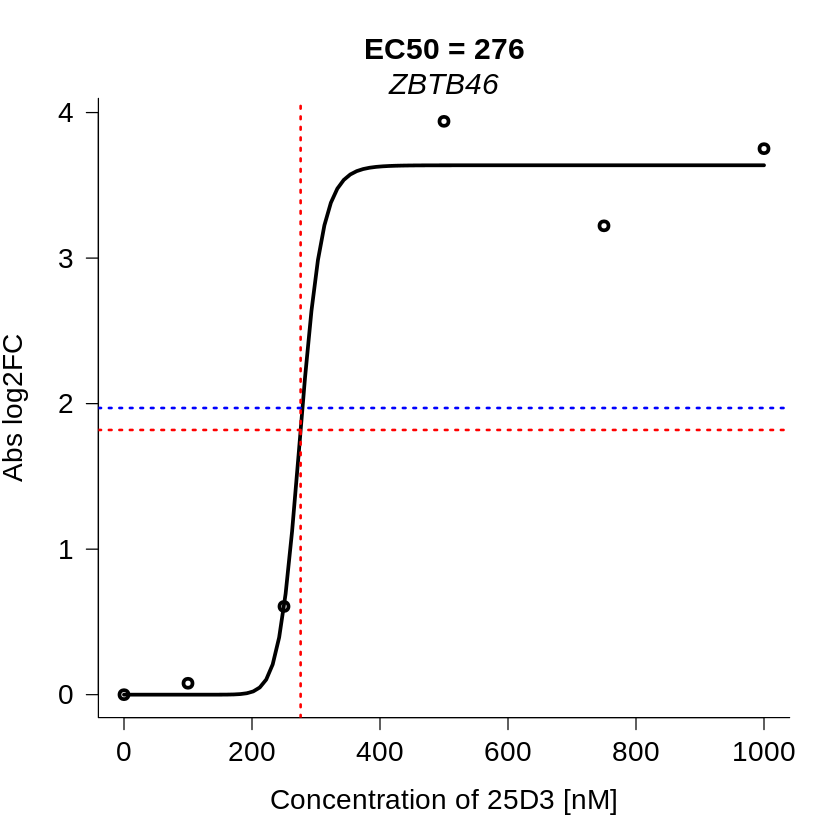

In [40]:
#plot_list = list()
for (i in seq_along(d$fit)){
   
#  pdf(paste("./Curves-cut-25D3/LL3_", d$name[[i]], "-25D3-cut.pdf", sep = ""), 
#      width = 5, height = 4.34)

      plot(d$fit[[i]],
       bty="l",  
       broken=TRUE, 
       lwd=3,
           log = "",
     # sub = d$name[[i]] #,
       main = paste0("EC50 = ", round(d$fit[[i]]$coefficients['ec_50:(Intercept)'],0)),
       cex.main = 1.5,
      xlab = "Concentration of 25D3 [nM]",
      ylab = "Abs log2FC",
  #    ylim = c(0, 3),
      cex.lab = 1.4,    # X-axis and Y-axis labels size
     cex.axis = 1.4 # Axis labels size
      )
#     mtext ("Top text", adj = 1.7, paste0 ("", d$name[[i]]), cex = 1.3, font = 3)
      mtext(side = 3, paste0 ("", d$name[[i]]), cex = 1.5, font = 3)
      abline(v = d$fit[[i]]$coefficients['ec_50:(Intercept)'], col="red", lwd=2.1, lty=3)
      abline(h = 0.5*(d$fit[[i]]$coefficients['max_value:(Intercept)']), col="red", lwd=2.1, lty=3)
      abline(h = 0.5*(d$real_maxval[[i]]), col="blue", lwd=2.1, lty=3)   
#dev.off()    
    }

In [41]:
models <- map(split(mrg2,
                    mrg2$name),
                    gene_model_LL.3)

result <- map_df(models,
                 tidy,
                 .id = "name")

head (result)

name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,hill,(Intercept),-1.545216,1.57229108,-0.9827797,0.398184256
ABCC3,max_value,(Intercept),2.076643,1.30999608,1.5852287,0.211093044
ABCC3,ec_50,(Intercept),419.321380,397.83774323,1.0540010,0.369270248
ACTB,hill,(Intercept),-6.053770,1.60026471,-3.7829806,0.032377557
ACTB,max_value,(Intercept),1.426124,0.07096189,20.0970382,0.000269288
ACTB,ec_50,(Intercept),348.141986,31.00365617,11.2290623,0.001514181


In [42]:
res_ec50 = result %>%
filter (., term == "ec_50")

head (res_ec50)

res_pred_maxval = result %>%
filter (., term == "max_value")

#head (res_pred_maxval)

res_ec50 = res_ec50 %>%
  mutate (treatment = rep("V25D3",nrow(.)))

head(res_ec50)

name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559


name,term,curve,estimate,std.error,statistic,p.value,treatment
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248,V25D3
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181,V25D3
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925,V25D3
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521,V25D3
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903,V25D3
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559,V25D3


In [43]:
library (metafor)

pooled_ED50 <- rma(estimate, std.error^2, data = res_ec50)
pooled_ED50

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack



Loading the 'metafor' package (version 3.0-2). For an
introduction to the package please type: help(metafor)


Warning message:
“Ratio of largest to smallest sampling variance extremely large. May not be able to obtain stable results.”



Random-Effects Model (k = 206; tau^2 estimator: REML)

tau^2 (estimated amount of total heterogeneity): 841.4537 (SE = 191.0186)
tau (square root of estimated tau^2 value):      29.0078
I^2 (total heterogeneity / total variability):   77.15%
H^2 (total variability / sampling variability):  4.38

Test for Heterogeneity:
Q(df = 205) = 981.4072, p-val < .0001

Model Results:

estimate      se     zval    pval     ci.lb     ci.ub 
340.6194  3.5784  95.1887  <.0001  333.6059  347.6328  *** 

---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


In [44]:
res_model = full_join (res_ec50, res_pred_maxval, by = c("name" = "name"), suffix=c(".ec_50","pred_maxval")) 

head (res_model)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248,V25D3,max_value,(Intercept),2.076643,1.30999608,1.585229,0.2110930439
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181,V25D3,max_value,(Intercept),1.426124,0.07096189,20.097038,0.0002692880
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925,V25D3,max_value,(Intercept),2.461140,0.27569876,8.926918,0.0029654236
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521,V25D3,max_value,(Intercept),2.344029,0.16503210,14.203475,0.0007561201
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903,V25D3,max_value,(Intercept),2.719239,0.13513864,20.121845,0.0002682992
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559,V25D3,max_value,(Intercept),2.755346,0.47918137,5.750111,0.0104488141


In [45]:
real_FC = as.vector (d$real_maxval)
#real_halfFC = as.vector (0.5*(d$real_maxval)) 

res_model2 = res_model %>%
add_column (real_FC) %>%
mutate (., pred_halfFC = 0.5*estimatepred_maxval) %>%
mutate (., real_halfFC = 0.5*real_FC) %>%
mutate (., ratio_predvsreal = (pred_halfFC/real_halfFC)) %>%
mutate (., perc_dev = abs(ratio_predvsreal-1)*100)

head (res_model2)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval,real_FC,pred_halfFC,real_halfFC,ratio_predvsreal,perc_dev
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),419.3214,397.83774,1.054001,0.369270248,V25D3,max_value,(Intercept),2.076643,1.30999608,1.585229,0.2110930439,1.547650,1.0383217,0.7738252,1.3418040,34.180401
ACTB,ec_50,(Intercept),348.1420,31.00366,11.229062,0.001514181,V25D3,max_value,(Intercept),1.426124,0.07096189,20.097038,0.0002692880,1.467328,0.7130619,0.7336639,0.9719191,2.808093
ACVRL1,ec_50,(Intercept),301.1984,38.28922,7.866404,0.004279925,V25D3,max_value,(Intercept),2.461140,0.27569876,8.926918,0.0029654236,2.333229,1.2305701,1.1666147,1.0548214,5.482139
ADAMTSL4,ec_50,(Intercept),390.1420,41.04722,9.504711,0.002469521,V25D3,max_value,(Intercept),2.344029,0.16503210,14.203475,0.0007561201,2.498829,1.1720147,1.2494146,0.9380511,6.194894
ADGRE1,ec_50,(Intercept),321.8782,25.40850,12.668130,0.001060903,V25D3,max_value,(Intercept),2.719239,0.13513864,20.121845,0.0002682992,2.863103,1.3596193,1.4315514,0.9497524,5.024762
ADGRE3,ec_50,(Intercept),293.4520,248.74124,1.179748,0.323133559,V25D3,max_value,(Intercept),2.755346,0.47918137,5.750111,0.0104488141,3.600812,1.3776731,1.8004058,0.7652014,23.479860


In [46]:
write.xlsx (res_model2, "./data/ec50table_25D3_LL3.xlsx")

In [47]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Rocky Linux 8.5 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /research/users/andreha/miniconda3/envs/Mamba-14/lib/libopenblasp-r0.3.18.so

locale:
 [1] LC_CTYPE=C.UTF-8           LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] metafor_3.0-2   Matrix_1.4-0    modelr_0.1.8    broom_0.7.11   
 [5] drc_3.0-1       MASS_7.3-54     ggpubr_0.4.0    reshape2_1.4.4 
 [9] ggrepel_0.9.1   magrittr_2.0.1  openxlsx_4.2.5  forcats_0.5.1  
[13] stringr_1.4.0   dplyr_1.0.7     purrr_0.3.4     readr_2.1.1    
[